# This notebook
1. Selects the patient, trial, variable
2. Load the corresponding DataFrame 



In [7]:
import os
import sys
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objs as go
import plotly.io as pio
from matplotlib.widgets import Slider
project_root = os.path.abspath(os.path.join(os.getcwd(), '..'))
if project_root not in sys.path:
    sys.path.insert(0, project_root)
from Data_loader import base_folders, iter_trial_paths
from PP_pipeline import downsample_df, segment_downsamp 
from segment_utils import segment_cycles, segment_cycles_norm, segment_cycles_simple

## From Dataframes 

Preprocessing options: 
    version:
    Raw: The original 48000 datapoints
    Downsampled: by a factor of 4 saved 
    Trimmed: after downsampling removed the first and last 10s 

    Normalized: normalizes (Z-score) after the chosen of raw, downsampled or trimmed 
    Segmented: after chosen raw, downsampled or trimmed  and if normalized or not uses segment_cycles

### Functions

In [8]:
#Function to plot one trial
def load_signal(patient_id, group_code, day, block, trial, signal_col, version):
    base_folder = os.path.abspath(base_folders[group_code])
    patient_folder = os.path.join(base_folder, patient_id)
    fname = f"{patient_id}_{group_code}_{day}_{block}_{trial}.csv"
    
    if version == 'raw':
        path = os.path.join(patient_folder, fname)
        if not os.path.exists(path):
            print(f"[ERROR] File not found: {path}")
            return None
        df = pd.read_csv(path)
        signal = df[signal_col].values
        print(f"[INFO] Loaded raw signal from: {path}")
        return signal, df
    
    elif version == 'downsampled':
        folder = os.path.join(patient_folder, 'trimmed')
        path = os.path.join(folder, fname)
        if not os.path.exists(path):
            print(f"[ERROR] Downsampled file not found: {path}")
            return None
        df = pd.read_csv(path)
        df_ds = df.iloc[::4].reset_index(drop=True)
        signal_ds = df_ds[signal_col].values
        print(f"[INFO] Loaded and downsampled signal from: {path}")
        return signal_ds, df_ds
        
    
    elif version == 'trimmed':
        trimmed_folder = os.path.join(patient_folder, 'trimmed')
        path = os.path.join(trimmed_folder, fname)
        if not os.path.exists(path):
            print(f"[ERROR] Trimmed file not found: {path}")
            return None
        df = pd.read_csv(path)
        signal = df[signal_col].values
        print(f"[INFO] Loaded trimmed signal from: {path}")
        return signal, df
    
    else:
        print(f"[ERROR] Unknown version: {version}")
        return None

def plot_trial(
    patient_id,
    group_code,
    day,
    block,
    trial,
    signal_col="Ankle Dorsiflexion RT (deg)",
    version='raw',  
    normalized=False,
    segmented=False,
    save_plots=False,
    results_dir="Results visualization"
):
    
    signal, df = load_signal(patient_id, group_code, day, block, trial, signal_col, version)
    

    
    if normalized:
        mean = np.mean(signal)
        std = np.std(signal)
        if std == 0:
            print("[WARN] Standard deviation is zero; normalization skipped.")
            signal_norm = signal - mean
        else:
            signal_norm = (signal - mean) / std
        signal_to_plot = signal_norm
        print(f"[INFO] Normalized signal with mean={mean:.2f}, std={std:.2f}")
    else:
        signal_to_plot = signal

    
    if segmented:              
        if normalized:
            cycles = segment_cycles_norm(df)
            if not cycles:
                print("[WARN] No cycles found for segmentation.")
                return
        else:
            cycles = segment_cycles_simple(df)
            if not cycles:
                print("[WARN] No cycles found for segmentation.")
                return
        

        # Graficar ciclos segmentados
        fig = go.Figure()
        for idx, c in enumerate(cycles):
            sig = c[signal_col]
            fig.add_trace(go.Scatter(
                y=sig.values,
                mode='lines',
                name=f'Cycle {idx+1}',
                opacity=0.5
            ))
        fig.update_layout(
            title=f"{patient_id}_{group_code}_{day}_{block}_{trial} | {signal_col} (Segmented)",
            xaxis_title='Sample (resampled)',
            yaxis_title='Angle (deg)',
            xaxis=dict(rangeslider=dict(visible=True), type='linear')
        )
        if save_plots:
            project_root = os.getcwd()
            results_folder = os.path.join(project_root, results_dir)
            os.makedirs(results_folder, exist_ok=True)
            fname_seg = f"{patient_id}_{group_code}_{day}_{block}_{trial}_{signal_col}_segmented.html"
            path_seg = os.path.join(results_folder, fname_seg)
            pio.write_html(fig, file=path_seg, auto_open=False)
        fig.show()
    
    else:
        label = version.capitalize()
        if normalized:
            label = "Normalized"
        fig = go.Figure()
        fig.add_trace(go.Scatter(y=signal_to_plot, mode='lines', name=label))
        fig.update_layout(
            title=f"{patient_id}_{group_code}_{day}_{block}_{trial} | {signal_col} ({label})",
            xaxis_title='Sample',
            yaxis_title='Angle (deg)' if not normalized else 'Z-score normalized Angle',
            xaxis=dict(rangeslider=dict(visible=True), type='linear')
        )
        if save_plots:
            project_root = os.getcwd()
            results_folder = os.path.join(project_root, results_dir)
            os.makedirs(results_folder, exist_ok=True)
            fname = f"{patient_id}_{group_code}_{day}_{block}_{trial}_{signal_col}_{label.lower()}.html"
            path = os.path.join(results_folder, fname)
            pio.write_html(fig, file=path, auto_open=False)
        fig.show()



### Usage

In [9]:
from Data_loader import iter_trial_paths

#One patient all trials 
signal_col = "Ankle Dorsiflexion RT (deg)"
group_code = "G01"
patient_folder = "C:\\Users\\57316\\OneDrive\\Escritorio\\2025-I\\TRABAJO DE GRADO I\\DATA SETS\\G01\\S001"
patient_id = "S001"
for day, block, trial, path in iter_trial_paths(patient_folder, patient_id, group_code):
    result = load_signal(patient_id, group_code, day, block, trial, signal_col, version='trimmed')
    if result is not None:
        plot_trial(patient_id, group_code, day, block, trial, signal_col, version='trimmed', normalized=False, segmented=True, save_plots=False, results_dir='Results visualization')





[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D01_B01_T01.csv
[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D01_B01_T01.csv
HS_R first 20: [ 162  392  622  852 1076 1304 1531 1760 1989 2219 2449 2675 2905 3135
 3361 3588 3814 4041 4264 4490]
HS_L first 20: [  48  276  504  736  962 1190 1415 1644 1873 2102 2333 2560 2788 3019
 3246 3472 3699 3926 4150 4376]
HS_R intervals: [230 230 230 224 228 227 229 229 230 230 226 230 230 226 227 226 227 223
 226 227]
HS_L intervals: [228 228 232 226 228 225 229 229 229 231 227 228 231 227 226 227 227 224
 226 227]


[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D01_B01_T02.csv
[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D01_B01_T02.csv
HS_R first 20: [ 200  427  655  882 1109 1337 1563 1789 2014 2238 2464 2685 2908 3130
 3354 3578 3801 4026 4250 4473]
HS_L first 20: [  86  311  539  767  993 1222 1449 1673 1898 2125 2350 2573 2796 3018
 3242 3464 3688 3912 4136 4358]
HS_R intervals: [227 228 227 227 228 226 226 225 224 226 221 223 222 224 224 223 225 224
 223 225]
HS_L intervals: [225 228 228 226 229 227 224 225 227 225 223 223 222 224 222 224 224 224
 222 226]


[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D01_B01_T03.csv
[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D01_B01_T03.csv
HS_R first 20: [   3  228  454  681  909 1134 1359 1583 1810 2033 2258 2480 2706 2934
 3159 3383 3607 3834 4062 4289]
HS_L first 20: [ 113  340  568  793 1020 1246 1470 1695 1921 2145 2368 2591 2817 3044
 3269 3494 3720 3947 4174 4398]
HS_R intervals: [225 226 227 228 225 225 224 227 223 225 222 226 228 225 224 224 227 228
 227 221]
HS_L intervals: [227 228 225 227 226 224 225 226 224 223 223 226 227 225 225 226 227 227
 224 221]


[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D01_B02_T01.csv
[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D01_B02_T01.csv
HS_R first 20: [ 210  438  663  893 1122 1351 1579 1804 2032 2260 2488 2716 2944 3173
 3398 3625 3854 4083 4312 4536]
HS_L first 20: [  95  323  549  777 1006 1236 1464 1691 1918 2145 2373 2601 2828 3057
 3283 3509 3736 3966 4196 4423]
HS_R intervals: [228 225 230 229 229 228 225 228 228 228 228 228 229 225 227 229 229 229
 224 228]
HS_L intervals: [228 226 228 229 230 228 227 227 227 228 228 227 229 226 226 227 230 230
 227 224]


[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D01_B02_T02.csv
[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D01_B02_T02.csv
HS_R first 20: [ 190  417  643  870 1096 1323 1549 1778 2007 2234 2460 2687 2913 3140
 3365 3591 3818 4041 4265 4488]
HS_L first 20: [  76  302  529  754  981 1208 1434 1661 1891 2120 2345 2571 2798 3025
 3252 3476 3704 3928 4151 4374]
HS_R intervals: [227 226 227 226 227 226 229 229 227 226 227 226 227 225 226 227 223 224
 223 225]
HS_L intervals: [226 227 225 227 227 226 227 230 229 225 226 227 227 227 224 228 224 223
 223 225]


[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D01_B02_T03.csv
[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D01_B02_T03.csv
HS_R first 20: [  53  285  519  751  979 1209 1440 1663 1889 2119 2349 2581 2808 3037
 3263 3487 3714 3939 4170 4400]
HS_L first 20: [ 166  401  634  862 1092 1324 1552 1775 2004 2233 2465 2695 2920 3150
 3374 3599 3827 4053 4283 4510]
HS_R intervals: [232 234 232 228 230 231 223 226 230 230 232 227 229 226 224 227 225 231
 230 224]
HS_L intervals: [235 233 228 230 232 228 223 229 229 232 230 225 230 224 225 228 226 230
 227 226]


[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D01_B03_T01.csv
[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D01_B03_T01.csv
HS_R first 20: [ 210  435  661  887 1115 1343 1568 1794 2020 2244 2469 2693 2917 3142
 3365 3589 3815 4039 4263 4487]
HS_L first 20: [  95  322  548  772  998 1228 1454 1678 1907 2132 2355 2579 2804 3028
 3251 3477 3700 3926 4150 4374]
HS_R intervals: [225 226 226 228 228 225 226 226 224 225 224 224 225 223 224 226 224 224
 224 226]
HS_L intervals: [227 226 224 226 230 226 224 229 225 223 224 225 224 223 226 223 226 224
 224 224]


[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D01_B03_T02.csv
[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D01_B03_T02.csv
HS_R first 20: [ 224  448  675  904 1132 1357 1582 1808 2031 2256 2481 2706 2930 3154
 3378 3600 3826 4048 4270 4490]
HS_L first 20: [ 109  335  560  788 1016 1243 1470 1695 1918 2143 2368 2593 2817 3041
 3265 3488 3711 3936 4158 4378]
HS_R intervals: [224 227 229 228 225 225 226 223 225 225 225 224 224 224 222 226 222 222
 220 224]
HS_L intervals: [226 225 228 228 227 227 225 223 225 225 225 224 224 224 223 223 225 222
 220 220]


[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D01_B03_T03.csv
[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D01_B03_T03.csv
HS_R first 20: [  86  309  534  761  988 1218 1447 1679 1907 2139 2370 2602 2829 3055
 3283 3511 3738 3969 4200 4430]
HS_L first 20: [ 195  419  645  873 1102 1331 1563 1790 2022 2254 2484 2714 2940 3167
 3395 3623 3852 4082 4314 4543]
HS_R intervals: [223 225 227 227 230 229 232 228 232 231 232 227 226 228 228 227 231 231
 230 228]
HS_L intervals: [224 226 228 229 229 232 227 232 232 230 230 226 227 228 228 229 230 232
 229 227]


[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D02_B01_T01.csv
[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D02_B01_T01.csv
HS_R first 20: [ 189  418  646  872 1100 1328 1554 1784 2015 2246 2472 2701 2927 3155
 3382 3608 3836 4066 4294 4520]
HS_L first 20: [  74  304  530  758  984 1212 1440 1668 1899 2131 2358 2586 2813 3041
 3268 3494 3720 3950 4177 4406]
HS_R intervals: [229 228 226 228 228 226 230 231 231 226 229 226 228 227 226 228 230 228
 226 228]
HS_L intervals: [230 226 228 226 228 228 228 231 232 227 228 227 228 227 226 226 230 227
 229 227]


[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D02_B01_T02.csv
[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D02_B01_T02.csv
HS_R first 20: [ 213  437  662  888 1115 1340 1566 1793 2019 2246 2471 2703 2929 3156
 3381 3608 3836 4065 4293 4520]
HS_L first 20: [  99  325  549  775 1000 1226 1452 1676 1905 2130 2358 2585 2813 3042
 3267 3494 3722 3949 4176 4406]
HS_R intervals: [224 225 226 227 225 226 227 226 227 225 232 226 227 225 227 228 229 228
 227 227]
HS_L intervals: [226 224 226 225 226 226 224 229 225 228 227 228 229 225 227 228 227 227
 230 227]


[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D02_B01_T03.csv
[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D02_B01_T03.csv
HS_R first 20: [ 202  425  649  878 1107 1336 1560 1787 2014 2243 2473 2702 2928 3153
 3378 3603 3832 4056 4283 4511]
HS_L first 20: [  88  311  535  762  990 1221 1446 1672 1898 2127 2356 2587 2814 3039
 3265 3490 3717 3943 4168 4396]
HS_R intervals: [223 224 229 229 229 224 227 227 229 230 229 226 225 225 225 229 224 227
 228 227]
HS_L intervals: [223 224 227 228 231 225 226 226 229 229 231 227 225 226 225 227 226 225
 228 227]


[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D02_B02_T01.csv
[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D02_B02_T01.csv
HS_R first 20: [   7  232  459  684  910 1133 1360 1583 1808 2034 2261 2482 2701 2925
 3148 3370 3596 3821 4047 4270]
HS_L first 20: [ 118  345  570  795 1021 1247 1469 1695 1923 2147 2371 2590 2812 3037
 3258 3483 3709 3933 4158 4382]
HS_R intervals: [225 227 225 226 223 227 223 225 226 227 221 219 224 223 222 226 225 226
 223 225]
HS_L intervals: [227 225 225 226 226 222 226 228 224 224 219 222 225 221 225 226 224 225
 224 227]


[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D02_B02_T02.csv
[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D02_B02_T02.csv
HS_R first 20: [  22  245  475  699  927 1154 1380 1603 1830 2059 2284 2512 2742 2968
 3196 3422 3646 3872 4100 4329]
HS_L first 20: [ 133  359  586  811 1039 1266 1491 1717 1944 2169 2397 2627 2854 3082
 3308 3533 3759 3985 4215 4440]
HS_R intervals: [223 230 224 228 227 226 223 227 229 225 228 230 226 228 226 224 226 228
 229 224]
HS_L intervals: [226 227 225 228 227 225 226 227 225 228 230 227 228 226 225 226 226 230
 225 225]


[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D02_B02_T03.csv
[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D02_B02_T03.csv
HS_R first 20: [  25  249  474  701  924 1149 1375 1602 1824 2048 2272 2499 2719 2944
 3165 3388 3614 3835 4058 4278]
HS_L first 20: [ 136  361  587  811 1037 1262 1488 1712 1936 2159 2386 2609 2831 3054
 3276 3500 3723 3947 4167 4387]
HS_R intervals: [224 225 227 223 225 226 227 222 224 224 227 220 225 221 223 226 221 223
 220 220]
HS_L intervals: [225 226 224 226 225 226 224 224 223 227 223 222 223 222 224 223 224 220
 220 219]


[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D02_B03_T01.csv
[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D02_B03_T01.csv
HS_R first 20: [  10  234  461  687  915 1144 1375 1602 1826 2053 2278 2506 2734 2959
 3186 3407 3630 3853 4078 4305]
HS_L first 20: [ 120  346  574  798 1029 1260 1488 1713 1938 2165 2391 2619 2845 3071
 3295 3518 3739 3965 4191 4414]
HS_R intervals: [224 227 226 228 229 231 227 224 227 225 228 228 225 227 221 223 223 225
 227 220]
HS_L intervals: [226 228 224 231 231 228 225 225 227 226 228 226 226 224 223 221 226 226
 223 222]


[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D02_B03_T02.csv
[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D02_B03_T02.csv
HS_R first 20: [  45  271  498  727  956 1182 1407 1633 1859 2087 2317 2539 2763 2990
 3213 3436 3661 3886 4108 4333]
HS_L first 20: [ 158  385  612  842 1070 1295 1520 1745 1972 2203 2427 2651 2878 3099
 3323 3548 3774 3996 4220 4444]
HS_R intervals: [226 227 229 229 226 225 226 226 228 230 222 224 227 223 223 225 225 222
 225 222]
HS_L intervals: [227 227 230 228 225 225 225 227 231 224 224 227 221 224 225 226 222 224
 224 222]


[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D02_B03_T03.csv
[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S001\trimmed\S001_G01_D02_B03_T03.csv
HS_R first 20: [  18  243  472  701  931 1160 1387 1614 1838 2066 2294 2520 2748 2970
 3195 3418 3640 3864 4084 4308]
HS_L first 20: [ 128  358  585  815 1044 1274 1502 1726 1951 2180 2408 2634 2859 3082
 3306 3527 3751 3973 4196 4417]
HS_R intervals: [225 229 229 230 229 227 227 224 228 228 226 228 222 225 223 222 224 220
 224 222]
HS_L intervals: [230 227 230 229 230 228 224 225 229 228 226 225 223 224 221 224 222 223
 221 223]


In [6]:
#One trial 
signal_col = "Ankle Dorsiflexion RT (deg)"
group_code = "G01"
patient_id = "S002"
day = "D01"
block = "B01"
trial = "T01"

result = load_signal(patient_id, group_code, day, block, trial, signal_col, version='trimmed')
if result is not None:
    plot_trial(patient_id, group_code, day, block, trial, signal_col, version='trimmed', normalized=False, segmented=False, save_plots=False, results_dir='Results visualization')
else:
    print(f"[ERROR] Could not load signal for {patient_id}_{group_code}_{day}_{block}_{trial}")


[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S002\trimmed\S002_G01_D01_B01_T01.csv
[INFO] Loaded trimmed signal from: C:\Users\57316\OneDrive\Escritorio\2025-I\TRABAJO DE GRADO I\DATA SETS\G01\young adults (19–35 years old)\S002\trimmed\S002_G01_D01_B01_T01.csv


## From Tensors 

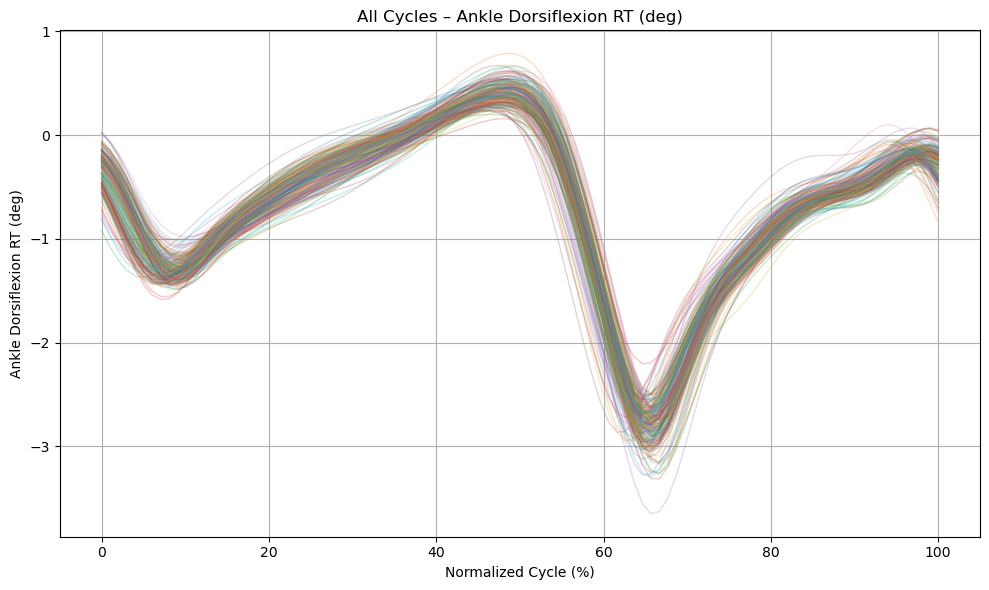

In [ ]:
# Plot the cycles for a specific trial
patient_id = "S004"
day = "01"
block = "01"
trial = "01"
tensor_path = f"/mnt/storage/dmartinez/young adults (19–35 years old)/{patient_id}/preprocessed/{patient_id}_D{day}_B{block}_T{trial}_preprocessed.npy"
csv_path = f"/mnt/storage/dmartinez/young adults (19–35 years old)/{patient_id}/trimmed/{patient_id}_G01_D{day}_B{block}_T{trial}.csv"

# 2) LOAD THE TENSOR AND CSV
tensor_3d = np.load(tensor_path)  # Shape: (n_cycles, target_length, n_variables)
df_trial = pd.read_csv(csv_path)

# 3) GET THE INDEX OF "Ankle Dorsiflexion RT (deg)"
variable_name = "Ankle Dorsiflexion RT (deg)"
if variable_name not in df_trial.columns:
    raise ValueError(f"The variable '{variable_name}' is not in the CSV columns.")
col_idx = df_trial.columns.get_loc(variable_name)
# Now col_idx is an integer between 0 and 320 (since there are 321 columns)

# 4) EXTRACT DATA FOR THAT VARIABLE
# tensor_3d has shape (183, 100, 321), so tensor_3d[:, :, col_idx] will be (183, 100)
data_variable = tensor_3d[:, :, col_idx]

# 5) CREATE A NORMALIZED TIME AXIS (0–100%)
n_cycles, target_length = data_variable.shape
time_axis = np.linspace(0, 100, target_length)

# 6) PLOT ALL CYCLES (183 CURVES)
plt.figure(figsize=(10, 6))
for i in range(n_cycles):
    plt.plot(time_axis, data_variable[i, :], alpha=0.25, linewidth=1)

plt.title(f"All Cycles – {variable_name}")
plt.xlabel("Normalized Cycle (%)")
plt.ylabel(variable_name)
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# 1. Check Tensor Dimensions
print(f"Tensor Dimensions: {tensor_3d.shape}")

# 2. Print Other Variables for a Single Cycle
cycle_to_inspect = 0  # Let's pick the first cycle (index 0)

# Extract data for the chosen cycle across all variables and all time points
single_cycle_data = tensor_3d[cycle_to_inspect, :, :]

# Get column names from the original CSV DataFrame
column_names = df_trial.columns.tolist()
metadata_column_names = ['patient_id', 'group', 'day', 'block', 'trial']
all_column_names = column_names + metadata_column_names
# Create a DataFrame for the selected cycle
# Each row represents a time point (0-100%), and each column is a variable
df_single_cycle = pd.DataFrame(single_cycle_data, columns=all_column_names)


# Add a normalized time axis to the DataFrame
time_axis = np.linspace(0, 100, tensor_3d.shape[1])
df_single_cycle.insert(0, 'Normalized Cycle (%)', time_axis)

print(f"\nData for Cycle {cycle_to_inspect} (first 5 rows and selected columns):")
# Display the first 5 rows and a selection of columns to avoid overwhelming output
# You can adjust or remove .iloc and .head() to see more data
print(df_single_cycle[['Normalized Cycle (%)', 'Ankle Dorsiflexion RT (deg)', 'Knee Flexion RT (deg)', 'Hip Flexion RT (deg)']].head())


Tensor Dimensions: (193, 100, 326)

Data for Cycle 0 (first 5 rows and selected columns):
   Normalized Cycle (%)  Ankle Dorsiflexion RT (deg)  Knee Flexion RT (deg)  \
0              0.000000                    -0.315781              -0.939980   
1              1.010101                    -0.448158              -0.883760   
2              2.020202                    -0.602084              -0.834120   
3              3.030303                    -0.762885              -0.791684   
4              4.040404                    -0.915123              -0.753359   

   Hip Flexion RT (deg)  
0              0.946696  
1              0.940798  
2              0.927452  
3              0.906345  
4              0.879878  


In [ ]:
df_single_cycle

# AutoEncoder Model 

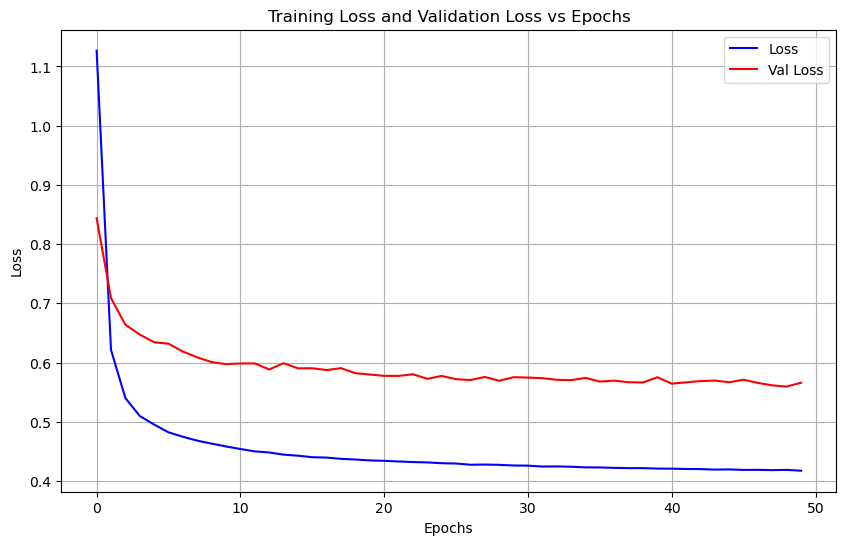

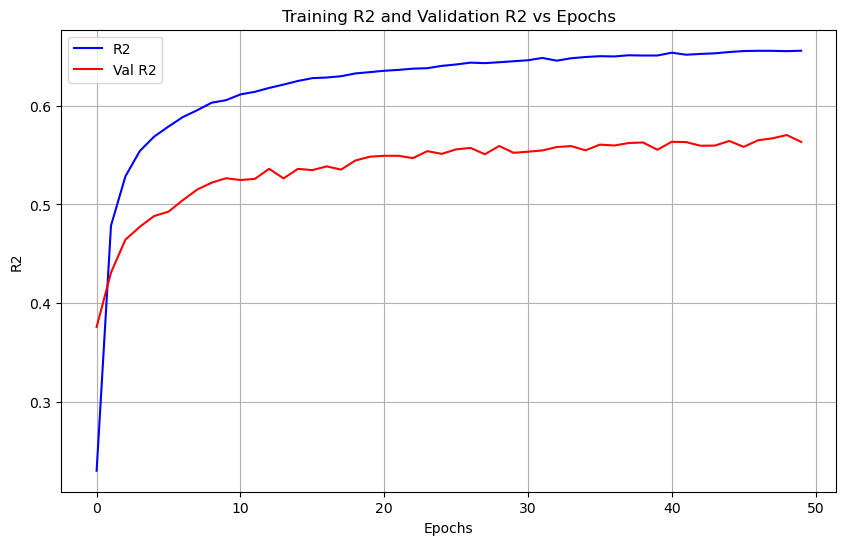

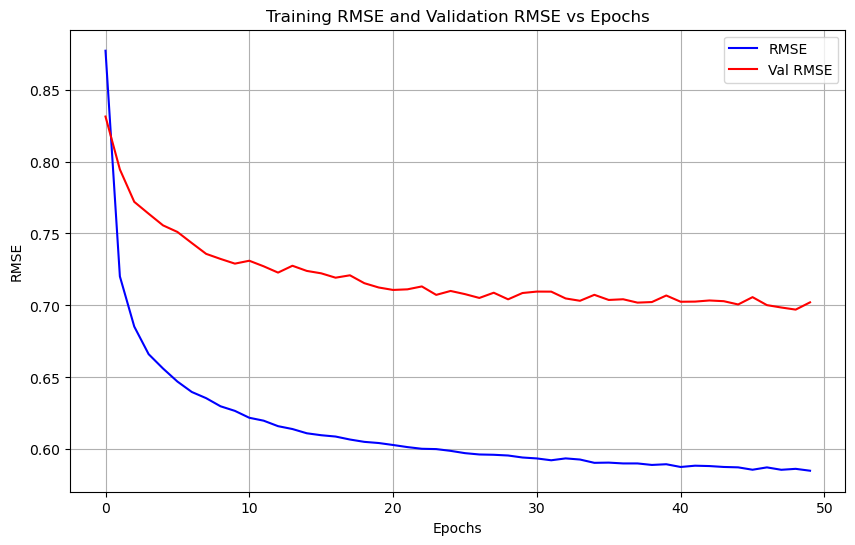

In [ ]:
#Plot loss y val loss
file_path = '../training_log_128_tanh_lr1e4_50ep_AdamW.csv'  
df = pd.read_csv(file_path)


epochs = df['epoch']
loss = df['loss']
val_loss = df['val_loss']
r2 = df['r2']
val_r2 = df['val_r2']
rmse = df['root_mean_squared_error']
val_rmse = df['val_root_mean_squared_error']


plt.figure(figsize=(10, 6))
plt.plot(epochs, loss, label='Loss', color='blue')
plt.plot(epochs, val_loss, label='Val Loss', color='red')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss and Validation Loss vs Epochs')
plt.legend()
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 6))
plt.plot(epochs, r2, label='R2', color='blue')
plt.plot(epochs, val_r2, label='Val R2', color='red')
plt.xlabel('Epochs')
plt.ylabel('R2')
plt.title('Training R2 and Validation R2 vs Epochs')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(epochs, rmse, label='RMSE', color='blue')
plt.plot(epochs, val_rmse, label='Val RMSE', color='red')
plt.xlabel('Epochs')    
plt.ylabel('RMSE')
plt.title('Training RMSE and Validation RMSE vs Epochs')
plt.legend()
plt.grid(True)
plt.show()


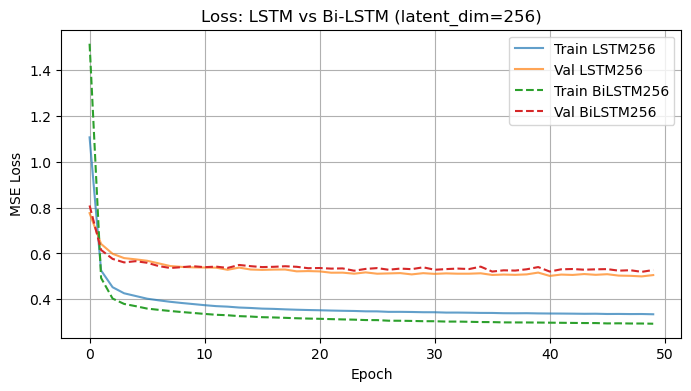

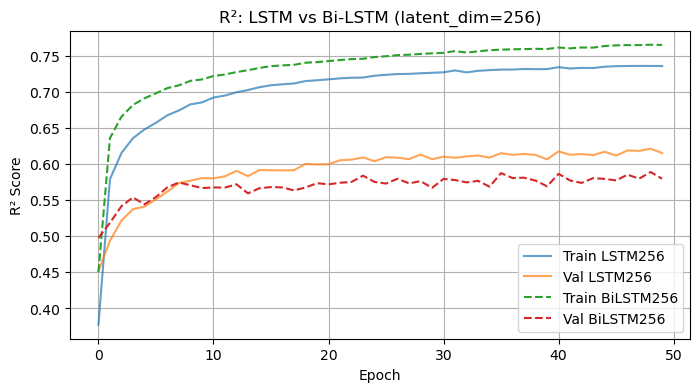

In [ ]:
#Comparar Bi-LSTM vs Normal 
# Rutas a los CSV de logs entrenados
log_lstm256 = "../training_log_256_tanh_lr1e4_50ep_AdamW.csv"
log_bilstm  = "../training_log_Bi_256_tanh_lr1e4_50ep_AdamW.csv"

# 1) Carga de los dataframes
df_lstm = pd.read_csv(log_lstm256)
df_bi   = pd.read_csv(log_bilstm)

# 2) Comparativa de pérdidas
plt.figure(figsize=(8,4))
plt.plot(df_lstm['epoch'], df_lstm['loss'],   label='Train LSTM256', alpha=0.7)
plt.plot(df_lstm['epoch'], df_lstm['val_loss'], label='Val LSTM256',  alpha=0.7)
plt.plot(df_bi['epoch'],   df_bi['loss'],      label='Train BiLSTM256', linestyle='--')
plt.plot(df_bi['epoch'],   df_bi['val_loss'],  label='Val BiLSTM256',  linestyle='--')
plt.xlabel('Epoch'); plt.ylabel('MSE Loss')
plt.title('Loss: LSTM vs Bi-LSTM (latent_dim=256)')
plt.legend(); plt.grid(True)
plt.show()

# 3) Comparativa de R²
plt.figure(figsize=(8,4))
plt.plot(df_lstm['epoch'], df_lstm['r2'],      label='Train LSTM256', alpha=0.7)
plt.plot(df_lstm['epoch'], df_lstm['val_r2'],  label='Val LSTM256',  alpha=0.7)
plt.plot(df_bi['epoch'],   df_bi['r2'],        label='Train BiLSTM256', linestyle='--')
plt.plot(df_bi['epoch'],   df_bi['val_r2'],    label='Val BiLSTM256',  linestyle='--')
plt.xlabel('Epoch'); plt.ylabel('R² Score')
plt.title('R²: LSTM vs Bi-LSTM (latent_dim=256)')
plt.legend(); plt.grid(True)
plt.show()


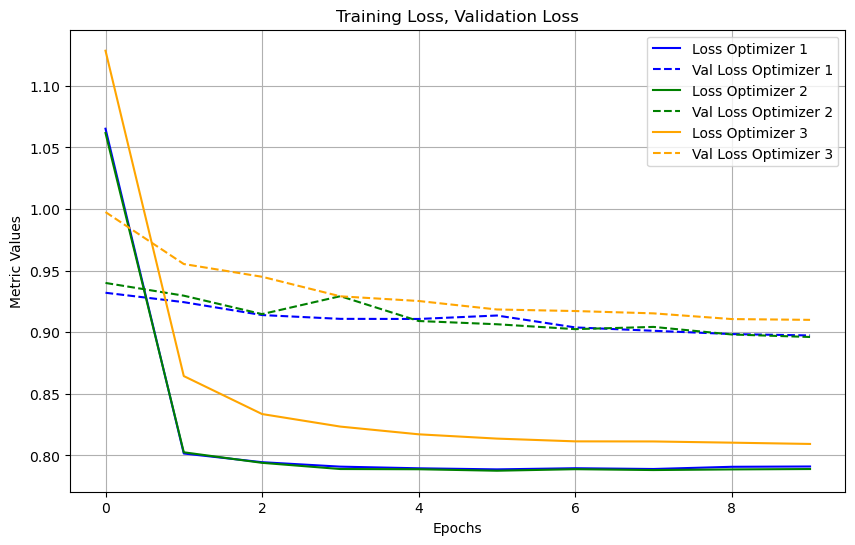

In [ ]:

# Cargar archivos con diferentes optimizadores
file_paths = [
    '../training_log_32_adam_lr1e4_50ep.csv',
    '../training_log_32_adamw_lr1e4_50ep.csv',  # Reemplaza con el path de tu segundo archivo
    '../training_log_32_sgd_lr1e4_50ep.csv'   # Reemplaza con el path de tu tercer archivo
]

# Colores para cada optimizador
colors = ['blue', 'green', 'orange']

# Crear una figura
plt.figure(figsize=(10, 6))

# Graficar las pérdidas y las métricas adicionales para cada archivo
for i, file_path in enumerate(file_paths):
    # Leer archivo
    df = pd.read_csv(file_path)
    
    epochs = df['epoch']
    loss = df['loss']
    val_loss = df['val_loss']
    
    # Graficar loss y val_loss
    plt.plot(epochs, loss, label=f'Loss Optimizer {i+1}', color=colors[i])
    plt.plot(epochs, val_loss, label=f'Val Loss Optimizer {i+1}', linestyle='--', color=colors[i])


"""

    # Si tienes R2 y RMSE, también puedes graficarlos
    r2 = df['r2']
    rmse = df['root_mean_squared_error']
    
    plt.plot(epochs, r2, label=f'R² Optimizer {i+1}', linestyle=':', color=colors[i])
    plt.plot(epochs, rmse, label=f'RMSE Optimizer {i+1}', linestyle='-.', color=colors[i])

    """

# Añadir etiquetas y título
plt.xlabel('Epochs')
plt.ylabel('Metric Values')
plt.title('Training Loss, Validation Loss')

# Mostrar leyenda
plt.legend()

# Mostrar grid y la gráfica
plt.grid(True)
plt.show()


